In [1]:
# # 데이터 다운로드
# !wget https://gd10-data.s3.ap-northeast-2.amazonaws.com/data.zip

# # 데이터 압축풀기
# !unzip data.zip

# # 기존 LMS
# # dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

# # 코랩
# dir_path = '/content/drive/MyDrive/colab_data/kitti_segmentation'

# # MyDrive로 파일 이동
# !mv data/ /content/drive/MyDrive/colab_data/kitti_segmentation/

In [2]:
# !rm data.zip

---
---

# 10-2. 시맨틱 세그멘테이션 데이터셋

위의 과정을 통해 데이터를 구글 드라이브에 업로드 완료

#### 데이터 로더(data loader) 만들기


In [1]:
!pip list | grep albumentations

albumentations                0.1.12


필요한 라이브러리 import

In [2]:
#필요한 라이브러리를 로드합니다. 
import os, datetime
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

Albumentation에서 다양한 augmentation 기법을 확률적으로 적용할 수 있게 해주는 Compose()의 활용 예시

In [3]:
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True):
  if is_train:    # 훈련용 데이터일 경우
    return Compose([
                    HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                    RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                        min_max_height=(300, 370),
                        w2h_ratio=370/1242,
                        height=224,
                        width=224,
                        p=0.5
                        ),
                    Resize(              # 입력이미지를 224X224로 resize
                        width=224,
                        height=224
                        )
                    ])
  return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
                Resize(
                    width=224,
                    height=224
                    )
                ])

Augmentation 적용해보기

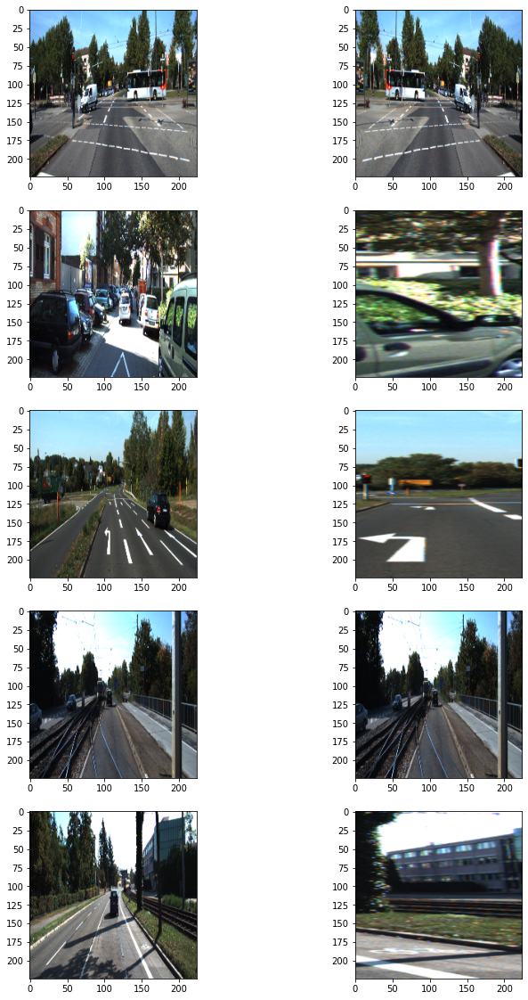

In [4]:
import os

dir_path = '/content/drive/MyDrive/colab_data/kitti_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지
  
plt.show()

데이터셋 구성을 위한 클래스 정의  
-> tf.keras.utils.Sequence를 상속받은 generator 형태

In [5]:
class KittiGenerator(tf.keras.utils.Sequence):
  '''
  KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
  우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
  '''
  def __init__(self, 
               dir_path,
               batch_size=16,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
    '''
    dir_path: dataset의 directory path입니다.
    batch_size: batch_size입니다.
    img_size: preprocess에 사용할 입력이미지의 크기입니다.
    output_size: ground_truth를 만들어주기 위한 크기입니다.
    is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
    augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
    '''
    self.dir_path = dir_path
    self.batch_size = batch_size
    self.is_train = is_train
    self.dir_path = dir_path
    self.augmentation = augmentation
    self.img_size = img_size
    self.output_size = output_size

    # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
    self.data = self.load_dataset()

  def load_dataset(self):
    # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
    # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
    input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
    label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
    input_images.sort()
    label_images.sort()
    assert len(input_images) == len(label_images)
    data = [ _ for _ in zip(input_images, label_images)]

    if self.is_train:
      return data[:-30]
    return data[-30:]
    
  def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
    return math.ceil(len(self.data) / self.batch_size)

  def __getitem__(self, index):
    # 입력과 출력을 만듭니다.
    # 입력은 resize및 augmentation이 적용된 input image이고 
    # 출력은 semantic label입니다.
    batch_data = self.data[
                           index*self.batch_size:
                           (index + 1)*self.batch_size
                           ]
    inputs = np.zeros([self.batch_size, *self.img_size])
    outputs = np.zeros([self.batch_size, *self.output_size])
        
    for i, data in enumerate(batch_data):
      input_img_path, output_path = data
      _input = imread(input_img_path)
      _output = imread(output_path)
      _output = (_output==7).astype(np.uint8)*1
      data = {
          "image": _input,
          "mask": _output,
          }
      augmented = self.augmentation(**data)
      inputs[i] = augmented["image"]/255
      outputs[i] = augmented["mask"]
      return inputs, outputs

  def on_epoch_end(self):
    # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
    self.indexes = np.arange(len(self.data))
    if self.is_train == True :
      np.random.shuffle(self.indexes)
      return self.indexes

데이터셋 구성하기

In [6]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

---

# 10-3. 시맨틱 세그멘테이션 모델

#### 모델 구조 만들기

![image](https://user-images.githubusercontent.com/97072815/162104952-adf631fd-b641-4ff3-89bc-c6dcf3b557a4.png)

[이미지 사이즈 변화]  

\- Contracting Path -  
224 -> 222 -> 220  
110 -> 108 -> 106  
53 -> 51 -> 49  
24 -> 22 -> 20  
10 -> 8 -> 6  

\- Expanding Path -  
12 -> 10 -> 8  
16 -> 14 -> 12  
24 -> 22 -> 20  
40 -> 38 -> 36  

-> 출력 사이즈가 너무 작아져서 좋지 않을 것 같으므로 padding을 추가해준다.  
이 때, 패딩은 'same'으로 같은 값을 미러링해준다.

[패딩을 포함한 이미지 사이즈 변화]  

\- Contracting Path -  
224 -> 224 -> 224  
112 -> 112 -> 112  
56 -> 56 -> 56  
28 -> 28 -> 28  
14 -> 14 -> 14  

\- Expanding Path -  
28 -> 28 -> 28  
56 -> 56 -> 56  
112 -> 112 -> 112  
224 -> 224 -> 224 

-> 모든 컨볼루션 레이어에 패딩을 추가하여 최종 출력이 입력과 같은 크기를 가진다.

In [7]:
def build_model(input_shape=(224, 224, 3)):
    inputs = Input(input_shape)

    # 위 그림의 구조를 그대로 차례차례 쌓아보자

    # Contracting Path
    conv1 = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same')(conv1)
    maxpool1 = MaxPool2D(pool_size=(2,2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', kernel_initializer='he_normal', padding='same')(maxpool1)
    conv2 = Conv2D(128, 3, activation='relu', kernel_initializer='he_normal', padding='same')(conv2)
    maxpool2 = MaxPool2D(pool_size=(2,2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', kernel_initializer='he_normal', padding='same')(maxpool2)
    conv3 = Conv2D(256, 3, activation='relu', kernel_initializer='he_normal', padding='same')(conv3)
    maxpool3 = MaxPool2D(pool_size=(2,2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', kernel_initializer='he_normal', padding='same')(maxpool3)
    conv4 = Conv2D(512, 3, activation='relu', kernel_initializer='he_normal', padding='same')(conv4)
    maxpool4 = MaxPool2D(pool_size=(2,2))(conv4)

    conv5 = Conv2D(1024, 3, activation='relu', kernel_initializer='he_normal', padding='same')(maxpool4)
    conv5 = Conv2D(1024, 3, activation='relu', kernel_initializer='he_normal', padding='same')(conv5)

    # Expanding Path
    # Upsampling에는 Transpose Convolution 레이어를 사용한다
    up_conv4 = Conv2DTranspose(512, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal')(conv5)
    # Skip connection은 concatenate 함수를 이용한다.
    merge4 = concatenate([conv4, up_conv4], axis=3)
    conv4_ = Conv2D(512, 3, activation='relu', kernel_initializer='he_normal', padding='same')(merge4)
    conv4_ = Conv2D(512, 3, activation='relu', kernel_initializer='he_normal', padding='same')(conv4_)

    up_conv3 = Conv2DTranspose(256, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal')(conv4_)
    merge3 = concatenate([conv3, up_conv3], axis=3)
    conv3_ = Conv2D(256, 3, activation='relu', kernel_initializer='he_normal', padding='same')(merge3)
    conv3_ = Conv2D(256, 3, activation='relu', kernel_initializer='he_normal', padding='same')(conv3_)

    up_conv2 = Conv2DTranspose(128, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal')(conv3_)
    merge2 = concatenate([conv2, up_conv2], axis=3)
    conv2_ = Conv2D(128, 3, activation='relu', kernel_initializer='he_normal', padding='same')(merge2)
    conv2_ = Conv2D(128, 3, activation='relu', kernel_initializer='he_normal', padding='same')(conv2_)

    up_conv1 = Conv2DTranspose(64, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal')(conv2_)
    merge1 = concatenate([conv1, up_conv1], axis=3)
    conv1_ = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same')(merge1)
    conv1_ = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same')(conv1_)

    # 최종 출력은 도로 하나에 대해서만 학습하므로 1개의 채널을 가진다.
    last_conv = Conv2D(1, 1, activation='sigmoid', kernel_initializer='he_normal')(conv1_)
    
    model = Model(inputs=inputs, outputs=last_conv)
    return model

모델 만들고 확인해보기

In [10]:
model = build_model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 224, 224, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 224, 224, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

아래 plot 이미지를 보면 Skip connection으로 인해 'U'자가 옆으로 누운듯한 모습을 나타낸다.

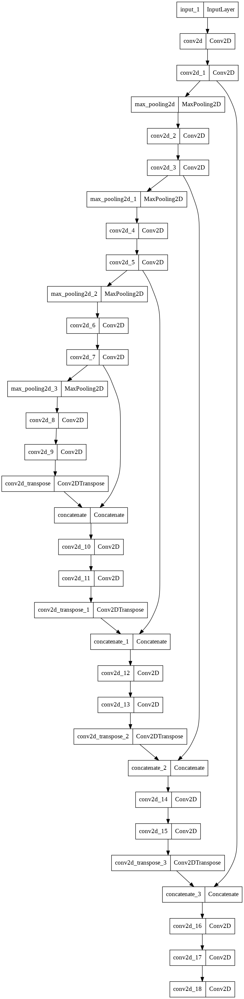

In [11]:
tf.keras.utils.plot_model(model)

In [134]:
model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unet'
MD = tf.keras.callbacks.ModelCheckpoint(
    filepath=model_path,
    save_weights_only=False,
    monitor='val_loss',
    mode='min',
    save_best_only=True,
)

ES = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=20,
    verbose=1
)

모델을 학습하고 저장

In [13]:
# 모델을 저장할 디렉토리 지정
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/seg_model_unet_min.h5' 

# 모델 생성
model = build_model() 

# 모델 컴파일
model.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy') 

# 모델 학습
model.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

# 모델 저장
#model.save(model_path)

Epoch 1/300
11/11 [==============================] - 20s 1s/step - loss: 0.6856 - val_loss: 0.6612
Epoch 2/300
11/11 [==============================] - 8s 757ms/step - loss: 0.4145 - val_loss: 0.0280
Epoch 3/300
11/11 [==============================] - 4s 321ms/step - loss: 0.0391 - val_loss: 0.0334
Epoch 4/300
11/11 [==============================] - 4s 322ms/step - loss: 0.0309 - val_loss: 0.0293
Epoch 5/300
11/11 [==============================] - 4s 322ms/step - loss: 0.0279 - val_loss: 0.0282
Epoch 6/300
11/11 [==============================] - 4s 321ms/step - loss: 0.0261 - val_loss: 0.0287
Epoch 7/300
11/11 [==============================] - 4s 319ms/step - loss: 0.0365 - val_loss: 0.0491
Epoch 8/300
11/11 [==============================] - 4s 320ms/step - loss: 0.0351 - val_loss: 0.0318
Epoch 9/300
11/11 [==============================] - 4s 320ms/step - loss: 0.0314 - val_loss: 0.0294
Epoch 10/300
11/11 [==============================] - 4s 322ms/step - loss: 0.0283 - val_loss

In [136]:
# 모델 학습
model.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

Epoch 1/300
11/11 [==============================] - 22s 1s/step - loss: 0.0294 - val_loss: 0.0181
Epoch 2/300
11/11 [==============================] - 7s 628ms/step - loss: 0.0155 - val_loss: 0.0194
Epoch 3/300
11/11 [==============================] - 7s 621ms/step - loss: 0.0173 - val_loss: 0.0210
Epoch 4/300
11/11 [==============================] - 12s 1s/step - loss: 0.0138 - val_loss: 0.0173
Epoch 5/300
11/11 [==============================] - 7s 605ms/step - loss: 0.0137 - val_loss: 0.0180
Epoch 6/300
11/11 [==============================] - 7s 608ms/step - loss: 0.0113 - val_loss: 0.0194
Epoch 7/300
11/11 [==============================] - 11s 1s/step - loss: 0.0148 - val_loss: 0.0168
Epoch 8/300
11/11 [==============================] - 13s 1s/step - loss: 0.0109 - val_loss: 0.0165
Epoch 9/300
11/11 [==============================] - 7s 607ms/step - loss: 0.0152 - val_loss: 0.0179
Epoch 10/300
11/11 [==============================] - 7s 612ms/step - loss: 0.0123 - val_loss: 0.01

# 10-4. 시맨틱 세그멘테이션 모델 시각화

모델 불러오기

In [140]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/seg_model_unet_min.h5'

model = tf.keras.models.load_model(model_path)

모델이 추론(inference)한 결과를 볼 수 있는 세그멘테이션 이미지 만들기

In [10]:
def get_output(model, preproc, image_path, output_path):
  org_img = imread(image_path)
  img_data = {"image":org_img}
  
  proc_data = preproc(**img_data)
  
  pred = model(np.expand_dims(proc_data["image"]/255, axis=0))
  pred = (pred[0].numpy()>0.5).astype(np.uint8).squeeze(-1)*255
  pred = Image.fromarray(pred).resize((org_img.shape[1], org_img.shape[0])).convert('RGBA')
  bg_img = Image.fromarray(org_img).convert('RGBA')

  output = Image.blend(bg_img, pred, alpha=0.6)
  output.show()

  return output

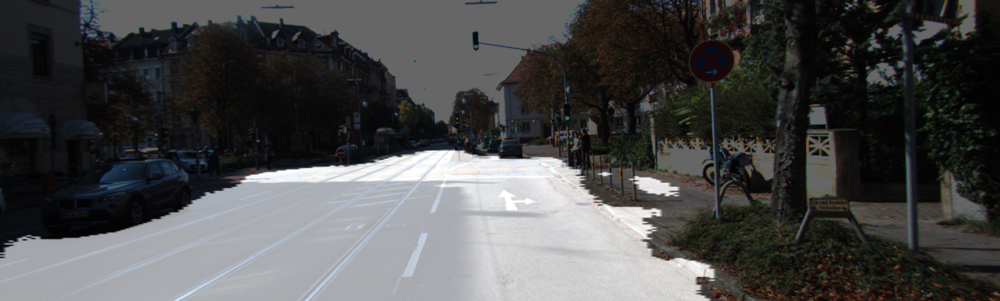

In [18]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

생각보다 아주 괜찮은 결과를 보여준다

In [11]:
# IoU를 계산해주는 함수
def calculate_iou_score(target, prediction):
    intersection = np.logical_and(target, prediction)
    union = np.logical_or(target, prediction)
    iou_score = float(np.sum(intersection)) / float(np.sum(union))
    print('IoU : %f' % iou_score )
    return iou_score

In [138]:
# 추측한 도로 영역을 원본 이미지 위에 나타내주는 함수
def get_output_(model, preproc, image_path, output_path, label_path, threshold=0.5):
  org_img = imread(image_path)
  img_data = {"image":org_img}
  
  proc_data = preproc(**img_data)
  
  seg = model(np.expand_dims(proc_data["image"]/255, axis=0))
  seg = (seg[0].numpy()>threshold).astype(np.uint8).squeeze(-1)*255
  pred = seg/255

  seg = Image.fromarray(seg).resize((org_img.shape[1], org_img.shape[0])).convert('RGBA')
  bg_img = Image.fromarray(org_img).convert('RGBA')

  output = Image.blend(bg_img, seg, alpha=0.8)
  plt.imshow(output)
  plt.show()

  if label_path: # 레이블 데이터가 존재하는 경우에만 target을 반환해준다 -> IoU 계산을 위함
    label_img = imread(label_path)
    label_data = {"image":label_img}
    proc_label = preproc(**label_data)
    proc_label = proc_label["image"]
    target = (proc_label == 7).astype(np.uint8)*1

    return output, pred, target
  else:
    return output, pred, _

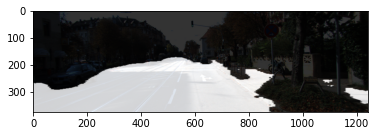

IoU : 0.856781


0.8567813419054784

In [141]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output_(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png',
     threshold = 0.5
 )

calculate_iou_score(target, prediction)

---
---

# 10-5. 프로젝트 : 개선된 U-Net 모델 만들기

### 평가 루브릭
(1) U-Net을 통한 세그멘테이션 작업이 정상적으로 진행되었는가?  
-> KITTI 데이터셋 구성, U-Net 모델 훈련, 결과물 시각화의 한 사이클이 정상 수행되어 세그멘테이션 결과 이미지를 제출하였다.

(2) U-Net++ 모델이 성공적으로 구현되었는가?  
-> U-Net++ 모델을 스스로 구현하여 학습 진행 후 세그멘테이션 결과까지 정상 진행되었다.

(3) U-Net과 U-Net++ 두 모델의 성능이 정량적/정성적으로 잘 비교되었는가?  
-> U-Net++ 의 세그멘테이션 결과 사진과 IoU 계산치를 U-Net과 비교하여 우월함을 확인하였다.

주요 라이브러리 확인

In [13]:
import tensorflow as tf
import numpy as np
import PIL
import skimage
import albumentations

print(tf.__version__)
print(np.__version__)
print(PIL.__version__)
print(skimage.__version__)
print(albumentations.__version__)

2.8.0
1.21.5
7.1.2
0.18.3
0.1.12


## Step 1. KITTI 데이터셋 수집과 구축

In [14]:
#필요한 라이브러리를 로드합니다. 
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

데이터 구성하는 작업은 위에서 이미 수행했으므로 생략

## Step 2. U-Net++ 모델의 구현

![image](https://user-images.githubusercontent.com/97072815/162142689-6bf40b28-d815-4415-92f8-5c9ec1990e69.png)

그림에 표시한 순서대로 레이어를 쌓을 예정이다.  

1st
> $X_{0,0}$을 생성한다.  

2nd
> $X_{1,0}$ 생성  
> -> upsampling 및 skip connection을 통해 $X_{0,1}$ 생성  

3rd
> $X_{2,0}$ 생성  
-> upsampling 및 skip connection을 통해 $X_{1,1}$ 생성  
-> upsampling 및 skip connection을 통해 $X_{0,2}$ 생성  

4th
> $X_{3,0}$ 생성  
-> upsampling 및 skip connection을 통해 $X_{2,1}$ 생성  
-> upsampling 및 skip connection을 통해 $X_{1,2}$ 생성  
-> upsampling 및 skip connection을 통해 $X_{0,3}$ 생성  

5th
> $X_{4,0}$ 생성  
-> upsampling 및 skip connection을 통해 $X_{3,1}$ 생성  
-> upsampling 및 skip connection을 통해 $X_{2,2}$ 생성  
-> upsampling 및 skip connection을 통해 $X_{1,3}$ 생성  
-> upsampling 및 skip connection을 통해 $X_{0,4}$ 생성  



![image](https://user-images.githubusercontent.com/97072815/162698807-b73711ef-30f4-462a-90f5-1dfbe7e8ec58.png)
(출처: https://arxiv.org/abs/1807.10165)

밑줄 친 부분을 보면 4개의 segmentation map을 만들어 내는데, 이를 평균하여 최종 segmentation map을 생성한다.


In [15]:
def build_unetpp(input_shape=(224, 224, 3), deep_supervision=False):
    inputs = Input(input_shape)
  
    # 순차적으로 진행하며 해당 시점에서 만들수 있는 블럭을 모두 만든다.

    # First
    conv_0_0 = Conv2D(32, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_0_0_stage_1')(inputs)
    conv_0_0 = Conv2D(32, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_0_0_stage_2')(conv_0_0)
    

    # Second
    mp_1 = MaxPool2D(pool_size=(2,2), name='max_pooling_1_0')(conv_0_0)
    conv_1_0 = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_1_0_stage_1')(mp_1)
    conv_1_0 = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_1_0_stage_2')(conv_1_0)

    up_0_1 = Conv2DTranspose(32, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_0_1')(conv_1_0)
    conv_0_1 = concatenate([up_0_1, conv_0_0], axis=3, name='concatenate_0_1')
    conv_0_1 = Conv2D(32, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_0_1_stage_1')(conv_0_1)
    conv_0_1 = Conv2D(32, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_0_1_stage_2')(conv_0_1)


    # Third
    mp_2 = MaxPool2D(pool_size=(2,2), name='max_pooling_2_0')(conv_1_0)
    conv_2_0 = Conv2D(128, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_2_0_stage_1')(mp_2)
    conv_2_0 = Conv2D(128, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_2_0_stage_2')(conv_2_0)

    up_1_1 = Conv2DTranspose(64, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_1_1')(conv_2_0)
    conv_1_1 = concatenate([up_1_1, conv_1_0], axis=3, name='concatenate_1_1')
    conv_1_1 = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_1_1_stage_1')(conv_1_1)
    conv_1_1 = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_1_1_stage_2')(conv_1_1)

    up_0_2 = Conv2DTranspose(32, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_0_2')(conv_1_1)
    conv_0_2 = concatenate([up_0_2, conv_0_0, conv_0_1], axis=3, name='concatenate_0_2')
    conv_0_2 = Conv2D(32, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_0_2_stage_1')(conv_0_2)
    conv_0_2 = Conv2D(32, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_0_2_stage_2')(conv_0_2)


    # Fourth
    mp_3 = MaxPool2D(pool_size=(2,2), name='max_pooling_3_0')(conv_2_0)
    conv_3_0 = Conv2D(256, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_3_0_stage_1')(mp_3)
    conv_3_0 = Conv2D(256, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_3_0_stage_2')(conv_3_0)
    
    up_2_1 = Conv2DTranspose(128, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_2_1')(conv_3_0)
    conv_2_1 = concatenate([up_2_1, conv_2_0], axis=3, name='concatenate_2_1')
    conv_2_1 = Conv2D(128, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_2_1_stage_1')(conv_2_1)
    conv_2_1 = Conv2D(128, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_2_1_stage_2')(conv_2_1)

    up_1_2 = Conv2DTranspose(64, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_1_2')(conv_2_1)
    conv_1_2 = concatenate([up_1_2, conv_1_0, conv_1_1], axis=3, name='concatenate_1_2')
    conv_1_2 = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_1_2_stage_1')(conv_1_2)
    conv_1_2 = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_1_2_stage_2')(conv_1_2)

    up_0_3 = Conv2DTranspose(32, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_0_3')(conv_1_2)
    conv_0_3 = concatenate([up_0_3, conv_0_0, conv_0_1, conv_0_2], axis=3, name='concatenate_0_3')
    conv_0_3 = Conv2D(32, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_0_3_stage_1')(conv_0_3)
    conv_0_3 = Conv2D(32, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_0_3_stage_2')(conv_0_3)


    # Fifth
    mp_4 = MaxPool2D(pool_size=(2,2), name='max_pooling_4_0')(conv_3_0)
    conv_4_0 = Conv2D(512, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_4_0_stage_1')(mp_4)
    conv_4_0 = Conv2D(512, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_4_0_stage_2')(conv_4_0)
    
    up_3_1 = Conv2DTranspose(256, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_3_1')(conv_4_0)
    conv_3_1 = concatenate([up_3_1, conv_3_0], axis=3, name='concatenate_3_1')
    conv_3_1 = Conv2D(256, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_3_1_stage_1')(conv_3_1)
    conv_3_1 = Conv2D(256, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_3_1_stage_2')(conv_3_1)

    up_2_2 = Conv2DTranspose(128, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_2_2')(conv_3_1)
    conv_2_2 = concatenate([up_2_2, conv_2_0, conv_2_1], axis=3, name='concatenate_2_2')
    conv_2_2 = Conv2D(128, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_2_2_stage_1')(conv_2_2)
    conv_2_2 = Conv2D(128, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_2_2_stage_2')(conv_2_2)

    up_1_3 = Conv2DTranspose(64, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_1_3')(conv_2_2)
    conv_1_3 = concatenate([up_1_3, conv_1_0, conv_1_1, conv_1_2], axis=3, name='concatenate_1_3')
    conv_1_3 = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_1_3_stage_1')(conv_1_3)
    conv_1_3 = Conv2D(64, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_1_3_stage_2')(conv_1_3)

    up_0_4 = Conv2DTranspose(32, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_0_4')(conv_1_3)
    conv_0_4 = concatenate([up_0_4, conv_0_0, conv_0_1, conv_0_2, conv_0_3], axis=3, name='concatenate_0_4')
    conv_0_4 = Conv2D(32, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_0_4_stage_1')(conv_0_4)
    conv_0_4 = Conv2D(32, 3, activation='relu', kernel_initializer='he_normal', padding='same', name='conv_0_4_stage_2')(conv_0_4)
    

    # output
    output_1 = Conv2D(1, 1, activation='sigmoid', kernel_initializer='he_normal', name='output_0_1')(conv_0_1)
    output_2 = Conv2D(1, 1, activation='sigmoid', kernel_initializer='he_normal', name='output_0_2')(conv_0_2)
    output_3 = Conv2D(1, 1, activation='sigmoid', kernel_initializer='he_normal', name='output_0_3')(conv_0_3)
    output_4 = Conv2D(1, 1, activation='sigmoid', kernel_initializer='he_normal', name='output_0_4')(conv_0_4)
   
    if deep_supervision:
      outputs = (output_1 + output_2 + output_3 + output_4) / 4
    else:
      outputs = output_4
    
    model = Model(inputs=inputs, outputs=outputs)
    # TODO: input_shape에 따라 U-Net을 만들어주세요
    # 이때 model은 fully convolutional해야 합니다.
    return model

In [27]:
model_unetpp_dp = build_unetpp(deep_supervision=True)
model_unetpp_dp.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv_0_0_stage_1 (Conv2D)      (None, 224, 224, 32  896         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 conv_0_0_stage_2 (Conv2D)      (None, 224, 224, 32  9248        ['conv_0_0_stage_1[0][0]']       
                                )                                                           

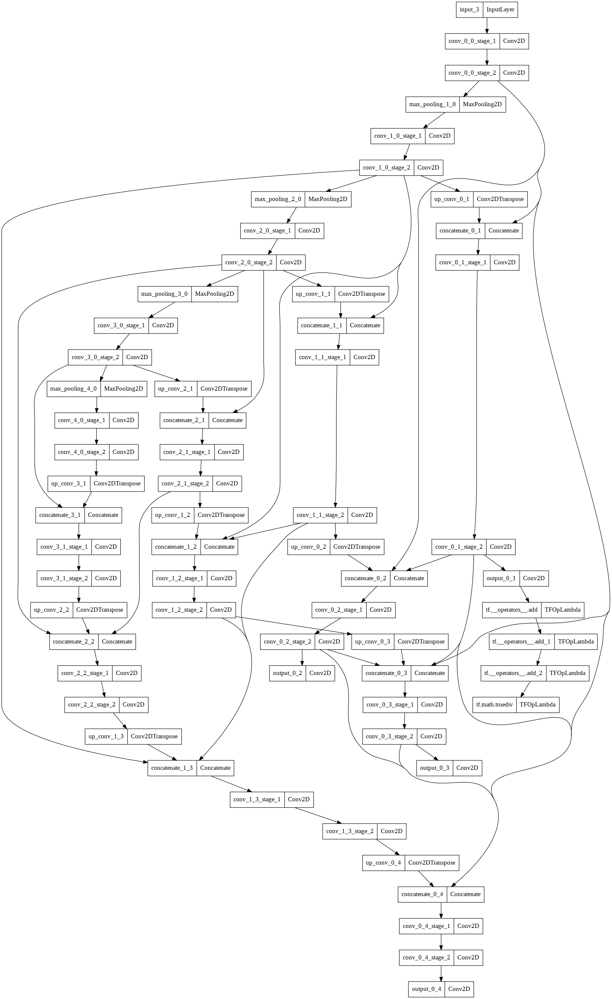

In [28]:
tf.keras.utils.plot_model(model_unetpp_dp)

Loss와 Metric 함수 정의  
dice coefficient에 대한 부분은 구글링을 통해 획득  
(출처: https://uos-deep-learning.tistory.com/3, https://theonly1.tistory.com/2858)

In [16]:
from keras import backend as K

# 노드에서 소개한 dice coefficient 함수
def dice_coef(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

# dice coefficient를 이용한 loss 함수
def dice_coef_loss(y_true, y_pred):
    return 1. - dice_coef(y_true, y_pred)

# binary crosentropy와 dice coefficient loss를 복합적으로 사용하여 새로운 loss 값을 반환하는 함수
def bce_dice_loss(y_true, y_pred):
    #return 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) - dice_coef(y_true, y_pred)
    return 1 + 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) - dice_coef(y_true, y_pred) # 값이 음수가 되는 경우도 있어 1을 더해줌

# 위의 loss가 왜 저렇게 구성되었는지 이해가 안되어 bce와 de의 가중치를 0.5씩 주어 합한 loss 새로 정의
def new_bce_dice_loss(y_true, y_pred):
    return 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) + 0.5 * dice_coef_loss(y_true, y_pred)

# IoU를 계산하는 함수. Metric으로 활용 예정
def iou_seg(y_true, y_pred, dtype=tf.float32):
    # tf tensor casting
    y_pred = tf.convert_to_tensor(y_pred)
    y_pred = tf.cast(y_pred, dtype)
    y_true = tf.cast(y_true, y_pred.dtype)

    y_pred = tf.squeeze(y_pred)
    y_true = tf.squeeze(y_true)
    
    y_true_pos = tf.reshape(y_true, [-1])
    y_pred_pos = tf.reshape(y_pred, [-1])

    area_intersect = tf.reduce_sum(tf.multiply(y_true_pos, y_pred_pos))
    
    area_true = tf.reduce_sum(y_true_pos)
    area_pred = tf.reduce_sum(y_pred_pos)
    area_union = area_true + area_pred - area_intersect
    
    # return 1-tf.math.divide_no_nan(area_intersect, area_union)
    return tf.math.divide_no_nan(area_intersect, area_union) # loss 형태로 반환하기에, IoU값을 그대로 반환하기 위해 수정

In [17]:
model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp_dp'
MD = tf.keras.callbacks.ModelCheckpoint(
    filepath=model_path,
    save_weights_only=False,
    monitor='val_iou_seg',
    mode='max',
    save_best_only=True,
)

ES = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    verbose=1
)

In [31]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp_min.h5'

model_unetpp_dp = build_unetpp(deep_supervision=True)

model_unetpp_dp.compile(optimizer = Adam(1e-4), loss = bce_dice_loss, metrics=iou_seg)

history_dp = model_unetpp_dp.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

#model_unetpp_dp.save(model_path)

Epoch 1/300
11/11 [==============================] - 16s 1s/step - loss: 1.3108 - iou_seg: 0.0196 - val_loss: 1.3023 - val_iou_seg: 0.0243
Epoch 2/300
11/11 [==============================] - 4s 358ms/step - loss: 1.3055 - iou_seg: 0.0215 - val_loss: 1.2941 - val_iou_seg: 0.0239
Epoch 3/300
11/11 [==============================] - 4s 359ms/step - loss: 1.2963 - iou_seg: 0.0185 - val_loss: 1.2686 - val_iou_seg: 0.0224
Epoch 4/300
11/11 [==============================] - 11s 1s/step - loss: 1.2449 - iou_seg: 0.0200 - val_loss: 1.1652 - val_iou_seg: 0.0313
Epoch 5/300
11/11 [==============================] - 11s 1s/step - loss: 1.0978 - iou_seg: 0.0321 - val_loss: 1.0105 - val_iou_seg: 0.0409
Epoch 6/300
11/11 [==============================] - 11s 1s/step - loss: 0.9471 - iou_seg: 0.0623 - val_loss: 0.8028 - val_iou_seg: 0.1331
Epoch 7/300
11/11 [==============================] - 11s 1s/step - loss: 0.7790 - iou_seg: 0.1466 - val_loss: 0.5855 - val_iou_seg: 0.2770
Epoch 8/300
11/11 [====

In [18]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp_min.h5'

model_unetpp_dp = tf.keras.models.load_model(model_path, custom_objects={'bce_dice_loss':bce_dice_loss, 'iou_seg': iou_seg})

loss를 binary crossentropy로 설정

In [25]:
model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp_dp_bc'
MD = tf.keras.callbacks.ModelCheckpoint(
    filepath=model_path,
    save_weights_only=False,
    monitor='val_iou_seg',
    mode='max',
    save_best_only=True,
)

ES = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    verbose=1
)

In [26]:
model_unetpp_dp_bc = build_unetpp(deep_supervision=True)

model_unetpp_dp_bc.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy', metrics=iou_seg)
history_dp_bc = model_unetpp_dp_bc.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp_bc_min.h5'
#model_unetpp_dp_bc.save(model_path)

Epoch 1/300
11/11 [==============================] - 29s 2s/step - loss: 0.6863 - iou_seg: 0.0109 - val_loss: 0.6758 - val_iou_seg: 0.0135
Epoch 2/300
11/11 [==============================] - 7s 660ms/step - loss: 0.6587 - iou_seg: 0.0068 - val_loss: 0.6114 - val_iou_seg: 0.0085
Epoch 3/300
11/11 [==============================] - 7s 665ms/step - loss: 0.4778 - iou_seg: 0.0064 - val_loss: 0.3665 - val_iou_seg: 0.0077
Epoch 4/300
11/11 [==============================] - 7s 661ms/step - loss: 0.2926 - iou_seg: 0.0091 - val_loss: 0.2305 - val_iou_seg: 0.0116
Epoch 5/300
11/11 [==============================] - 13s 1s/step - loss: 0.1843 - iou_seg: 0.0161 - val_loss: 0.1594 - val_iou_seg: 0.0194
Epoch 6/300
11/11 [==============================] - 14s 1s/step - loss: 0.1461 - iou_seg: 0.0177 - val_loss: 0.1502 - val_iou_seg: 0.0206
Epoch 7/300
11/11 [==============================] - 14s 1s/step - loss: 0.1388 - iou_seg: 0.0228 - val_loss: 0.1373 - val_iou_seg: 0.0234
Epoch 8/300
11/11 [==

In [27]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp_bc_min.h5'

model_unetpp_dp_bc = tf.keras.models.load_model(model_path, custom_objects={'iou_seg': iou_seg})

loss를 dice coefficient로 설정

In [143]:
model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp_dp_dc'
MD = tf.keras.callbacks.ModelCheckpoint(
    filepath=model_path,
    save_weights_only=False,
    monitor='val_iou_seg',
    mode='max',
    save_best_only=True,
)

ES = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=20,
    verbose=1
)

In [29]:
model_unetpp_dp_dc = build_unetpp(deep_supervision=True)

model_unetpp_dp_dc.compile(optimizer = Adam(1e-4), loss = dice_coef_loss, metrics=iou_seg)

history_dp_dc = model_unetpp_dp_dc.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp_dp_dc'
#model_unetpp_dp_dc.save(model_path)

Epoch 1/300
11/11 [==============================] - 16s 1s/step - loss: 0.9669 - iou_seg: 0.0169 - val_loss: 0.9553 - val_iou_seg: 0.0228
Epoch 2/300
11/11 [==============================] - 14s 1s/step - loss: 0.9480 - iou_seg: 0.0270 - val_loss: 0.9399 - val_iou_seg: 0.0310
Epoch 3/300
11/11 [==============================] - 14s 1s/step - loss: 0.9485 - iou_seg: 0.0266 - val_loss: 0.9358 - val_iou_seg: 0.0332
Epoch 4/300
11/11 [==============================] - 14s 1s/step - loss: 0.9458 - iou_seg: 0.0281 - val_loss: 0.9344 - val_iou_seg: 0.0340
Epoch 5/300
11/11 [==============================] - 14s 1s/step - loss: 0.9421 - iou_seg: 0.0301 - val_loss: 0.9337 - val_iou_seg: 0.0343
Epoch 6/300
11/11 [==============================] - 14s 1s/step - loss: 0.9496 - iou_seg: 0.0261 - val_loss: 0.9333 - val_iou_seg: 0.0346
Epoch 7/300
11/11 [==============================] - 14s 1s/step - loss: 0.9452 - iou_seg: 0.0282 - val_loss: 0.9329 - val_iou_seg: 0.0348
Epoch 8/300
11/11 [========

In [144]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp_dc_min.h5'

model_unetpp_dp_dc = tf.keras.models.load_model(model_path, custom_objects={'dice_coef_loss': dice_coef_loss,'iou_seg': iou_seg})

Deep Supervision을 포함하지 않은 모델도 학습

In [31]:
model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp'
MD = tf.keras.callbacks.ModelCheckpoint(
    filepath=model_path,
    save_weights_only=False,
    monitor='val_iou_seg',
    mode='max',
    save_best_only=True,
)

ES = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    verbose=1
)

In [32]:
model_unetpp = build_unetpp()

model_unetpp.compile(optimizer = Adam(1e-4), loss = bce_dice_loss, metrics=iou_seg)

history_org = model_unetpp.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_min.h5'
#model_unetpp.save(model_path)

Epoch 1/300
11/11 [==============================] - 16s 1s/step - loss: 1.3139 - iou_seg: 0.0179 - val_loss: 1.3075 - val_iou_seg: 0.0238
Epoch 2/300
11/11 [==============================] - 7s 655ms/step - loss: 1.3094 - iou_seg: 0.0212 - val_loss: 1.3010 - val_iou_seg: 0.0214
Epoch 3/300
11/11 [==============================] - 7s 658ms/step - loss: 1.3074 - iou_seg: 0.0174 - val_loss: 1.2824 - val_iou_seg: 0.0215
Epoch 4/300
11/11 [==============================] - 13s 1s/step - loss: 1.2454 - iou_seg: 0.0242 - val_loss: 1.1493 - val_iou_seg: 0.0298
Epoch 5/300
11/11 [==============================] - 14s 1s/step - loss: 0.9602 - iou_seg: 0.0772 - val_loss: 0.5302 - val_iou_seg: 0.3342
Epoch 6/300
11/11 [==============================] - 14s 1s/step - loss: 0.5889 - iou_seg: 0.3334 - val_loss: 0.3402 - val_iou_seg: 0.5401
Epoch 7/300
11/11 [==============================] - 14s 1s/step - loss: 0.5445 - iou_seg: 0.3905 - val_loss: 0.3105 - val_iou_seg: 0.5627
Epoch 8/300
11/11 [====

In [33]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_min.h5'

model_unetpp = tf.keras.models.load_model(model_path, custom_objects={'bce_dice_loss': bce_dice_loss,'iou_seg': iou_seg})

In [34]:
model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp_bc'
MD = tf.keras.callbacks.ModelCheckpoint(
    filepath=model_path,
    save_weights_only=False,
    monitor='val_iou_seg',
    mode='max',
    save_best_only=True,
)

ES = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    verbose=1
)

In [35]:
model_unetpp_bc = build_unetpp()

model_unetpp_bc.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy', metrics=iou_seg)
history_org_bc = model_unetpp_bc.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_bc_min.h5'
#model_unetpp_bc.save(model_path)

Epoch 1/300
11/11 [==============================] - 16s 1s/step - loss: 0.6930 - iou_seg: 0.0101 - val_loss: 0.6741 - val_iou_seg: 0.0090
Epoch 2/300
11/11 [==============================] - 14s 1s/step - loss: 0.6609 - iou_seg: 0.0075 - val_loss: 0.6313 - val_iou_seg: 0.0119
Epoch 3/300
11/11 [==============================] - 13s 1s/step - loss: 0.5296 - iou_seg: 0.0107 - val_loss: 0.2217 - val_iou_seg: 0.0174
Epoch 4/300
11/11 [==============================] - 14s 1s/step - loss: 0.0758 - iou_seg: 0.1251 - val_loss: 0.0299 - val_iou_seg: 0.2829
Epoch 5/300
11/11 [==============================] - 7s 655ms/step - loss: 0.0301 - iou_seg: 0.2303 - val_loss: 0.0272 - val_iou_seg: 0.2772
Epoch 6/300
11/11 [==============================] - 13s 1s/step - loss: 0.0254 - iou_seg: 0.2079 - val_loss: 0.0254 - val_iou_seg: 0.3012
Epoch 7/300
11/11 [==============================] - 7s 646ms/step - loss: 0.0253 - iou_seg: 0.2332 - val_loss: 0.0302 - val_iou_seg: 0.2880
Epoch 8/300
11/11 [====

In [36]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_bc_min.h5'

model_unetpp_bc = tf.keras.models.load_model(model_path, custom_objects={'iou_seg': iou_seg})

## Step 3. U-Net 과 U-Net++ 모델이 수행한 세그멘테이션 결과 분석

1) U-Net
- loss: binary crossentropy  
- 모델: model

2) U-Net++(w/o Deep Supervision)
- loss: **bce_dice_loss**  
- 모델: model_unetpp  

3) U-Net++(w/o Deep Supervision) 
- loss: binary crossentropy  
- 모델: model_unetpp_bc  

4) U-Net++(w/ Deep Supervision) 
- loss: **bce_dice_loss**  
- 모델: model_unetpp_dp  

5) U-Net++(w/ Deep Supervision) 
- loss: binary crossentropy  
- 모델: model_unetpp_dp_bc  

6) U-Net++(w/ Deep Supervision) 
- loss: **dice_coeff_loss**  
- 모델: model_unetpp_dp_dc  


In [37]:
def get_output(model, preproc, image_path, output_path):
  org_img = imread(image_path)
  img_data = {"image":org_img}
  
  proc_data = preproc(**img_data)
  pred = model(np.expand_dims(proc_data["image"]/255, axis=0))
  pred = (pred[0].numpy()>0.5).astype(np.uint8).squeeze()*255 # squeeze() 함수는 불필요한 차원을 축소해주는 함수인데 기존처럼 -1이 들어가 있으면 원하는 대로 축소되지 않아 괄호 안을 비워둠
  pred = Image.fromarray(pred)
  pred = pred.resize((org_img.shape[1], org_img.shape[0])).convert('RGBA')
  bg_img = Image.fromarray(org_img).convert('RGBA')

  output = Image.blend(bg_img, pred, alpha=0.6)

  # 이미지 출력을 위한 부분
  plt.figure(figsize=(15, 15))
  plt.imshow(output)

  #return output


    # TODO: image_path로 입력된 이미지를 입력받아 preprocess를 해서 model로 infernece한 결과를 시각화하고 
    # 이를 output_path에 저장하는 함수를 작성해주세요.

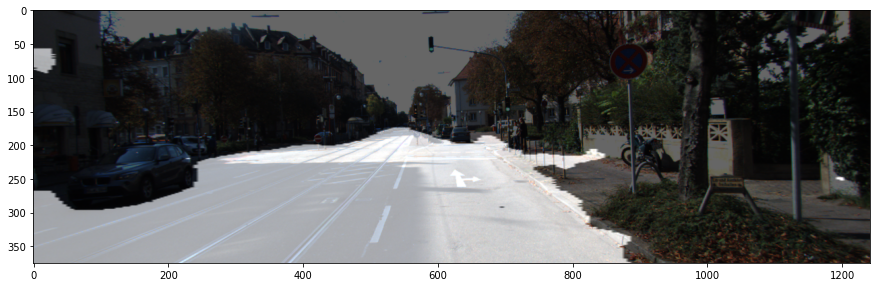

In [38]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
get_output(
     model_unetpp_dp, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

원본 이미지와 Ground Truth 이미지를 출력하는 함수

In [128]:
def get_origin(i): # 매개변수로 이미지 넘버값을 받는다.
  image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png'
  label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
  preproc = test_preproc

  org_img = imread(image_path)
  img_data = {"image":org_img}
  
  proc_data = preproc(**img_data)

  bg_img = Image.fromarray(org_img).convert('RGBA')

  if label_path:
    label_img = imread(label_path)
    label_data = {"image":label_img}
    proc_label = preproc(**label_data)
    proc_label = proc_label["image"]
    target = (proc_label == 7).astype(np.uint8)*1
    new_target = Image.fromarray(target*255).resize((org_img.shape[1], org_img.shape[0])).convert('RGBA')

    output = Image.blend(bg_img, new_target, alpha=0.5)


    print('* Original')
    plt.figure(figsize=(8, 8))
    plt.imshow(bg_img) # 이미지 출력
    plt.show() # 여러개의 이미지를 텍스트와 함께 순서에 맞게 출력하기 위해 필요

    print('* Ground Truth')
    plt.figure(figsize=(8, 8))
    plt.imshow(output)
    plt.show()


* Original


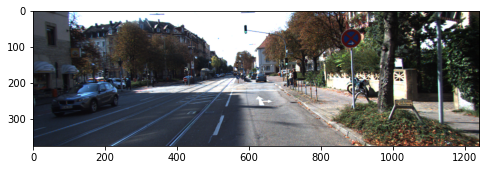

* Ground Truth


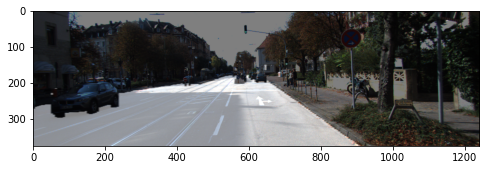

In [129]:
get_origin(1)

In [116]:
# IoU와 도로 영역 추측 결과를 합성한 이미지 출력을 한번에 쉽게 하기 위한 함수
def get_output_simple(model, i, threshold=0.5): # 매개변수로 모델과 이미지 넘버, threshold 값을 받는다.
  image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png'
  output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
  label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
  preproc = test_preproc

  org_img = imread(image_path)
  img_data = {"image":org_img}
  
  proc_data = preproc(**img_data)
  
  seg = model(np.expand_dims(proc_data["image"]/255, axis=0))
  seg = (seg[0].numpy()>threshold).astype(np.uint8).squeeze()*255
  pred = seg/255

  seg = Image.fromarray(seg).resize((org_img.shape[1], org_img.shape[0])).convert('RGBA')
  bg_img = Image.fromarray(org_img).convert('RGBA')

  output = Image.blend(bg_img, seg, alpha=0.5)


  if label_path:
    label_img = imread(label_path)
    label_data = {"image":label_img}
    proc_label = preproc(**label_data)
    proc_label = proc_label["image"]
    target = (proc_label == 7).astype(np.uint8)*1
    IoU = calculate_iou_score(target, pred) # IoU를 계산하고 출력
    plt.figure(figsize=(8, 8))
    plt.imshow(output) # 이미지 출력
    plt.show() # 여러개의 이미지를 텍스트와 함께 순서에 맞게 출력하기 위해 필요
    

    return output, pred, target
  else:
    return output, pred, _


    # TODO: image_path로 입력된 이미지를 입력받아 preprocess를 해서 model로 infernece한 결과를 시각화하고 
    # 이를 output_path에 저장하는 함수를 작성해주세요.

In [130]:
# 여러 모델의 결과를 한번에 확인하기 위한 함수 정의
def print_and_show(img_num, models, th = 0.5):
  print('-'*19)
  print(f'----- Image {img_num} -----')
  print('-'*19)
 
  get_origin(img_num)
  print('-'*19)
  
  if type(models) == list:
    for i, mo in enumerate(models):
      print(f'(Model {i+1})')
      output, prediction, target = get_output_simple(mo, img_num, threshold = th)
      print('-'*80)
  else:
    output, prediction, target = get_output_simple(models, img_num, threshold = th)
    print('-'*80)

* image 1

-------------------
----- Image 1 -----
-------------------
* Original


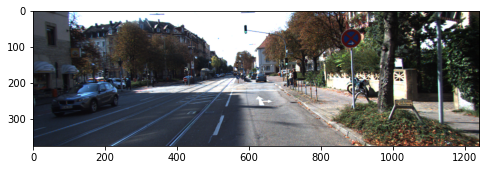

* Ground Truth


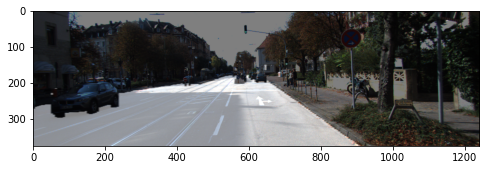

-------------------
(Model 1)
IoU : 0.856781


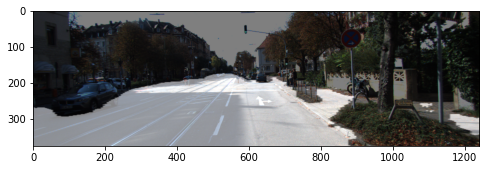

--------------------------------------------------------------------------------
(Model 2)
IoU : 0.798741


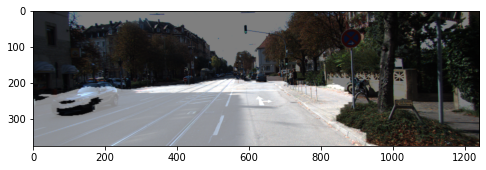

--------------------------------------------------------------------------------
(Model 3)
IoU : 0.781706


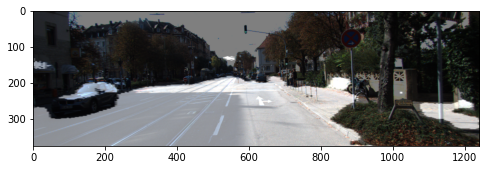

--------------------------------------------------------------------------------
(Model 4)
IoU : 0.901865


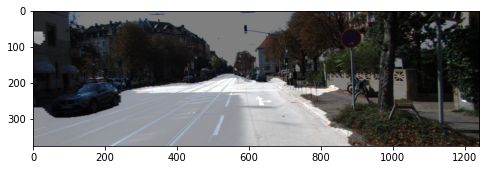

--------------------------------------------------------------------------------
(Model 5)
IoU : 0.000000


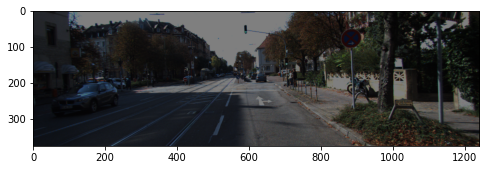

--------------------------------------------------------------------------------
(Model 6)
IoU : 0.882550


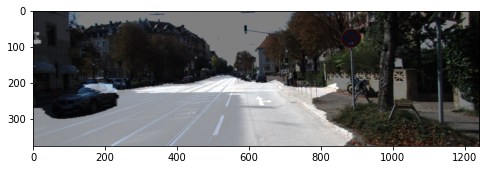

--------------------------------------------------------------------------------


In [142]:
print_and_show(1, [model, model_unetpp, model_unetpp_bc, model_unetpp_dp, model_unetpp_dp_bc, model_unetpp_dp_dc])

* image 11

-------------------
----- Image 11 -----
-------------------
(Model 1)
IoU : 0.720912


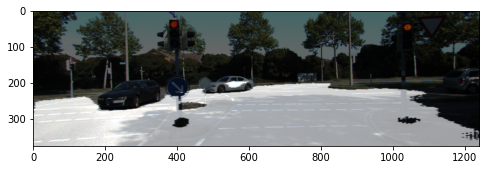

--------------------------------------------------------------------------------
(Model 2)
IoU : 0.673794


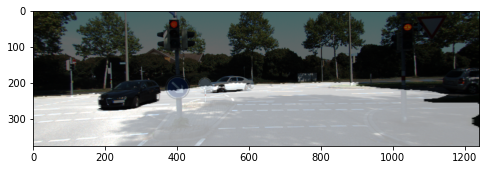

--------------------------------------------------------------------------------
(Model 3)
IoU : 0.702618


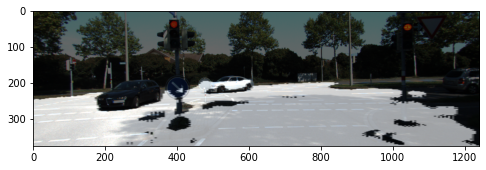

--------------------------------------------------------------------------------
(Model 4)
IoU : 0.721681


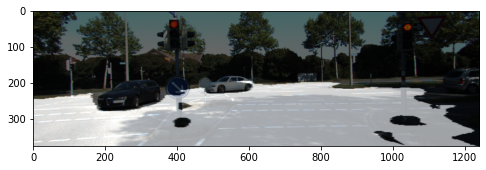

--------------------------------------------------------------------------------
(Model 5)
IoU : 0.000000


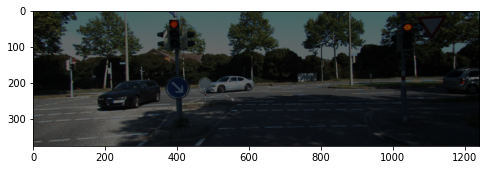

--------------------------------------------------------------------------------
(Model 6)
IoU : 0.705343


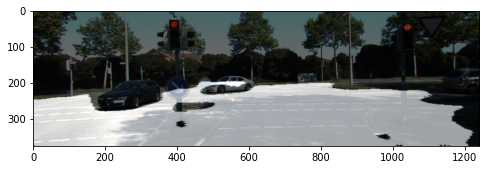

--------------------------------------------------------------------------------


In [43]:
print_and_show(11, [model, model_unetpp, model_unetpp_bc, model_unetpp_dp, model_unetpp_dp_bc, model_unetpp_dp_dc])

**U-Net++ 모델의 성능이 높다는 느낌을 받지 못함**  
--> Convolution 레이어마다 Batch normalization을 추가해주면 안정되지 않을까?  
--> 그러기 위해 Convolution 레이어가 두 번 반복 되는 곳을 블럭화 하여 모델 구성

In [45]:
# 각 노드(?)마다 기본이 되는 블럭
def block(input, ch=32, kn=3, stage='0_0'):
  conv1 = Conv2D(ch, kn, kernel_initializer='he_normal', padding='same', name=f'conv_{stage}_stage_1')(input)
  bn1 = BatchNormalization(name=f'BN_{stage}_stage_1')(conv1)
  act1 = Activation('relu', name=f'relu_{stage}_stage_1')(bn1)
  conv2 = Conv2D(ch, kn, kernel_initializer='he_normal', padding='same', name=f'conv_{stage}_stage_2')(act1)
  bn2 = BatchNormalization(name=f'BN_{stage}_stage_2')(conv2)
  act2 = Activation('relu', name=f'relu_{stage}_stage_2')(bn2)
  return act2

# Batch Normalization을 추가하여 조금더 안정된 U-Net++를 생성하는 함수
def build_unetpp_(input_shape=(224, 224, 3), deep_supervision=False):
    inputs = Input(input_shape)
  
    # 순차적으로 진행하며 해당 시점에서 만들수 있는 블럭을 모두 만든다.

    # First
    conv_0_0 = block(input=inputs, ch=32, stage='0_0')
    

    # Second
    mp_1 = MaxPool2D(pool_size=(2,2), name='max_pooling_1_0')(conv_0_0)
    conv_1_0 = block(input=mp_1, ch=64, stage='1_0')

    up_0_1 = Conv2DTranspose(32, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_0_1')(conv_1_0)
    conv_0_1 = concatenate([up_0_1, conv_0_0], axis=3, name='concatenate_0_1')
    conv_0_1 = block(input=conv_0_1, ch=32, stage='0_1')


    # Third
    mp_2 = MaxPool2D(pool_size=(2,2), name='max_pooling_2_0')(conv_1_0)
    conv_2_0 = block(input=mp_2, ch=128, stage='2_0')

    up_1_1 = Conv2DTranspose(64, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_1_1')(conv_2_0)
    conv_1_1 = concatenate([up_1_1, conv_1_0], axis=3, name='concatenate_1_1')
    conv_1_1 = block(input=conv_1_1, ch=64, stage='1_1')

    up_0_2 = Conv2DTranspose(32, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_0_2')(conv_1_1)
    conv_0_2 = concatenate([up_0_2, conv_0_0, conv_0_1], axis=3, name='concatenate_0_2')
    conv_0_2 = block(input=conv_0_2, ch=32, stage='0_2')


    # Fourth
    mp_3 = MaxPool2D(pool_size=(2,2), name='max_pooling_3_0')(conv_2_0)
    conv_3_0 = block(input=mp_3, ch=256, stage='3_0')
    
    up_2_1 = Conv2DTranspose(128, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_2_1')(conv_3_0)
    conv_2_1 = concatenate([up_2_1, conv_2_0], axis=3, name='concatenate_2_1')
    conv_2_1 = block(input=conv_2_1, ch=128, stage='2_1')

    up_1_2 = Conv2DTranspose(64, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_1_2')(conv_2_1)
    conv_1_2 = concatenate([up_1_2, conv_1_0, conv_1_1], axis=3, name='concatenate_1_2')
    conv_1_2 = block(input=conv_1_2, ch=64, stage='1_2')

    up_0_3 = Conv2DTranspose(32, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_0_3')(conv_1_2)
    conv_0_3 = concatenate([up_0_3, conv_0_0, conv_0_1, conv_0_2], axis=3, name='concatenate_0_3')
    conv_0_3 = block(input=conv_0_3, ch=32, stage='0_3')


    # Fifth
    mp_4 = MaxPool2D(pool_size=(2,2), name='max_pooling_4_0')(conv_3_0)
    conv_4_0 = block(input=mp_4, ch=512, stage='4_0')
    
    up_3_1 = Conv2DTranspose(256, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_3_1')(conv_4_0)
    conv_3_1 = concatenate([up_3_1, conv_3_0], axis=3, name='concatenate_3_1')
    conv_3_1 = block(input=conv_3_1, ch=256, stage='3_1')

    up_2_2 = Conv2DTranspose(128, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_2_2')(conv_3_1)
    conv_2_2 = concatenate([up_2_2, conv_2_0, conv_2_1], axis=3, name='concatenate_2_2')
    conv_2_2 = block(input=conv_2_2, ch=128, stage='2_2')

    up_1_3 = Conv2DTranspose(64, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_1_3')(conv_2_2)
    conv_1_3 = concatenate([up_1_3, conv_1_0, conv_1_1, conv_1_2], axis=3, name='concatenate_1_3')
    conv_1_3 = block(input=conv_1_3, ch=64, stage='1_3')

    up_0_4 = Conv2DTranspose(32, 2, strides=(2,2), activation='relu', kernel_initializer='he_normal', name='up_conv_0_4')(conv_1_3)
    conv_0_4 = concatenate([up_0_4, conv_0_0, conv_0_1, conv_0_2, conv_0_3], axis=3, name='concatenate_0_4')
    conv_0_4 = block(input=conv_0_4, ch=32, stage='0_4')
    

    # output
    output_1 = Conv2D(1, 1, activation='sigmoid', kernel_initializer='he_normal', name='output_0_1')(conv_0_1)
    output_2 = Conv2D(1, 1, activation='sigmoid', kernel_initializer='he_normal', name='output_0_2')(conv_0_2)
    output_3 = Conv2D(1, 1, activation='sigmoid', kernel_initializer='he_normal', name='output_0_3')(conv_0_3)
    output_4 = Conv2D(1, 1, activation='sigmoid', kernel_initializer='he_normal', name='output_0_4')(conv_0_4)
   
    if deep_supervision:
      outputs = (output_1 + output_2 + output_3 + output_4) / 4
    else:
      outputs = output_4
    
    model = Model(inputs=inputs, outputs=outputs)
    return model

In [150]:
model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp_dp_bn'
MD = tf.keras.callbacks.ModelCheckpoint(
    filepath=model_path,
    save_weights_only=False,
    monitor='val_iou_seg',
    mode='max',
    save_best_only=True,
)

ES = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=30,
    verbose=1
)

In [47]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp_bn_min.h5'

model_unetpp_dp_bn = build_unetpp_(deep_supervision=True)

model_unetpp_dp_bn.compile(optimizer = Adam(1e-4), loss = bce_dice_loss, metrics=iou_seg)
history_dp_bn = model_unetpp_dp_bn.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

#model_unetpp_dp_bn.save(model_path)

Epoch 1/300
11/11 [==============================] - 25s 2s/step - loss: 1.3168 - iou_seg: 0.0189 - val_loss: 1.3099 - val_iou_seg: 0.0195
Epoch 2/300
11/11 [==============================] - 21s 2s/step - loss: 1.2999 - iou_seg: 0.0177 - val_loss: 1.3039 - val_iou_seg: 0.0204
Epoch 3/300
11/11 [==============================] - 21s 2s/step - loss: 1.2647 - iou_seg: 0.0234 - val_loss: 1.2960 - val_iou_seg: 0.0214
Epoch 4/300
11/11 [==============================] - 21s 2s/step - loss: 1.2077 - iou_seg: 0.0388 - val_loss: 1.2873 - val_iou_seg: 0.0239
Epoch 5/300
11/11 [==============================] - 22s 2s/step - loss: 1.2199 - iou_seg: 0.0268 - val_loss: 1.2769 - val_iou_seg: 0.0247
Epoch 6/300
11/11 [==============================] - 21s 2s/step - loss: 1.1786 - iou_seg: 0.0335 - val_loss: 1.2638 - val_iou_seg: 0.0270
Epoch 7/300
11/11 [==============================] - 21s 2s/step - loss: 1.1400 - iou_seg: 0.0415 - val_loss: 1.2483 - val_iou_seg: 0.0289
Epoch 8/300
11/11 [========

In [152]:
history_dp_bn = model_unetpp_dp_bn.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

Epoch 1/300
11/11 [==============================] - 25s 2s/step - loss: 0.3319 - iou_seg: 0.5766 - val_loss: 0.2267 - val_iou_seg: 0.6451
Epoch 2/300
11/11 [==============================] - 8s 694ms/step - loss: 0.1957 - iou_seg: 0.6919 - val_loss: 0.3063 - val_iou_seg: 0.5466
Epoch 3/300
11/11 [==============================] - 8s 700ms/step - loss: 0.4180 - iou_seg: 0.5015 - val_loss: 0.2465 - val_iou_seg: 0.6224
Epoch 4/300
11/11 [==============================] - 8s 701ms/step - loss: 0.2135 - iou_seg: 0.6755 - val_loss: 0.3297 - val_iou_seg: 0.5202
Epoch 5/300
11/11 [==============================] - 8s 705ms/step - loss: 0.1593 - iou_seg: 0.7338 - val_loss: 0.2568 - val_iou_seg: 0.6083
Epoch 6/300
11/11 [==============================] - 22s 2s/step - loss: 0.3053 - iou_seg: 0.5986 - val_loss: 0.2251 - val_iou_seg: 0.6477
Epoch 7/300
11/11 [==============================] - 20s 2s/step - loss: 0.1425 - iou_seg: 0.7578 - val_loss: 0.2158 - val_iou_seg: 0.6602
Epoch 8/300
11/11 [

In [153]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp_bn_min.h5'

model_unetpp_dp_bn = tf.keras.models.load_model(model_path, custom_objects={'bce_dice_loss': bce_dice_loss, 'iou_seg': iou_seg})

In [69]:
model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp_dp_bn_'
MD = tf.keras.callbacks.ModelCheckpoint(
    filepath=model_path,
    save_weights_only=False,
    monitor='val_iou_seg',
    mode='max',
    save_best_only=True,
)

ES = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=30,
    verbose=1
)

In [50]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp_bn__min.h5'

model_unetpp_dp_bn_ = build_unetpp_(deep_supervision=True)

model_unetpp_dp_bn_.compile(optimizer = Adam(1e-4), loss = new_bce_dice_loss, metrics=iou_seg)
history_dp_bn_ = model_unetpp_dp_bn_.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

#model_unetpp_dp_bn_.save(model_path)

Epoch 1/300
11/11 [==============================] - 26s 2s/step - loss: 0.7910 - iou_seg: 0.0188 - val_loss: 0.8233 - val_iou_seg: 0.0184
Epoch 2/300
11/11 [==============================] - 20s 2s/step - loss: 0.7604 - iou_seg: 0.0186 - val_loss: 0.8147 - val_iou_seg: 0.0189
Epoch 3/300
11/11 [==============================] - 21s 2s/step - loss: 0.7217 - iou_seg: 0.0267 - val_loss: 0.8033 - val_iou_seg: 0.0196
Epoch 4/300
11/11 [==============================] - 22s 2s/step - loss: 0.6787 - iou_seg: 0.0377 - val_loss: 0.7896 - val_iou_seg: 0.0209
Epoch 5/300
11/11 [==============================] - 22s 2s/step - loss: 0.6420 - iou_seg: 0.0478 - val_loss: 0.7747 - val_iou_seg: 0.0225
Epoch 6/300
11/11 [==============================] - 21s 2s/step - loss: 0.6375 - iou_seg: 0.0383 - val_loss: 0.7581 - val_iou_seg: 0.0245
Epoch 7/300
11/11 [==============================] - 22s 2s/step - loss: 0.6075 - iou_seg: 0.0505 - val_loss: 0.7395 - val_iou_seg: 0.0268
Epoch 8/300
11/11 [========

In [78]:
history_dp_bn_ = model_unetpp_dp_bn_.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

Epoch 1/300
11/11 [==============================] - 13s 820ms/step - loss: 0.0784 - iou_seg: 0.7598 - val_loss: 0.1163 - val_iou_seg: 0.6547
Epoch 2/300
11/11 [==============================] - 8s 741ms/step - loss: 0.1355 - iou_seg: 0.6713 - val_loss: 0.1438 - val_iou_seg: 0.5824
Epoch 3/300
11/11 [==============================] - 8s 744ms/step - loss: 0.1247 - iou_seg: 0.6680 - val_loss: 0.3288 - val_iou_seg: 0.2704
Epoch 4/300
11/11 [==============================] - 8s 744ms/step - loss: 0.1526 - iou_seg: 0.6203 - val_loss: 0.2431 - val_iou_seg: 0.3981
Epoch 5/300
11/11 [==============================] - 8s 744ms/step - loss: 0.1592 - iou_seg: 0.6203 - val_loss: 0.1521 - val_iou_seg: 0.5687
Epoch 6/300
11/11 [==============================] - 8s 743ms/step - loss: 0.1116 - iou_seg: 0.7128 - val_loss: 0.2175 - val_iou_seg: 0.4411
Epoch 7/300
11/11 [==============================] - 8s 746ms/step - loss: 0.1116 - iou_seg: 0.7070 - val_loss: 0.2555 - val_iou_seg: 0.3878
Epoch 8/300


In [70]:
# model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp_bn__min.h5'

model_unetpp_dp_bn_ = tf.keras.models.load_model(model_path, custom_objects={'new_bce_dice_loss': new_bce_dice_loss, 'iou_seg': iou_seg})

In [83]:
model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp_dp_'
MD = tf.keras.callbacks.ModelCheckpoint(
    filepath=model_path,
    save_weights_only=False,
    monitor='val_iou_seg',
    mode='max',
    save_best_only=True,
)

ES = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=30,
    verbose=1
)

In [53]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp__min.h5'

model_unetpp_dp_ = build_unetpp(deep_supervision=True)

model_unetpp_dp_.compile(optimizer = Adam(1e-4), loss = new_bce_dice_loss, metrics=iou_seg)
history_dp_ = model_unetpp_dp_.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

#model_unetpp_dp_.save(model_path)

Epoch 1/300
11/11 [==============================] - 17s 1s/step - loss: 0.8313 - iou_seg: 0.0133 - val_loss: 0.8250 - val_iou_seg: 0.0169
Epoch 2/300
11/11 [==============================] - 7s 677ms/step - loss: 0.8256 - iou_seg: 0.0088 - val_loss: 0.7997 - val_iou_seg: 0.0124
Epoch 3/300
11/11 [==============================] - 8s 685ms/step - loss: 0.7209 - iou_seg: 0.0122 - val_loss: 0.6324 - val_iou_seg: 0.0167
Epoch 4/300
11/11 [==============================] - 13s 1s/step - loss: 0.6177 - iou_seg: 0.0133 - val_loss: 0.5943 - val_iou_seg: 0.0217
Epoch 5/300
11/11 [==============================] - 14s 1s/step - loss: 0.5765 - iou_seg: 0.0142 - val_loss: 0.5465 - val_iou_seg: 0.0316
Epoch 6/300
11/11 [==============================] - 15s 1s/step - loss: 0.5348 - iou_seg: 0.0399 - val_loss: 0.5286 - val_iou_seg: 0.0442
Epoch 7/300
11/11 [==============================] - 14s 1s/step - loss: 0.5257 - iou_seg: 0.0436 - val_loss: 0.5121 - val_iou_seg: 0.0543
Epoch 8/300
11/11 [====

In [90]:
history_dp_ = model_unetpp_dp_.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=300,
     callbacks=[MD, ES]
 )

Epoch 1/300
11/11 [==============================] - 27s 2s/step - loss: 0.3141 - iou_seg: 0.6151 - val_loss: 0.1767 - val_iou_seg: 0.7147
Epoch 2/300
11/11 [==============================] - 8s 750ms/step - loss: 0.1202 - iou_seg: 0.7927 - val_loss: 0.1850 - val_iou_seg: 0.7049
Epoch 3/300
11/11 [==============================] - 8s 760ms/step - loss: 0.1030 - iou_seg: 0.8196 - val_loss: 0.1849 - val_iou_seg: 0.7026
Epoch 4/300
11/11 [==============================] - 8s 760ms/step - loss: 0.1857 - iou_seg: 0.7432 - val_loss: 0.1794 - val_iou_seg: 0.7097
Epoch 5/300
11/11 [==============================] - 8s 753ms/step - loss: 0.3766 - iou_seg: 0.5580 - val_loss: 0.2786 - val_iou_seg: 0.5807
Epoch 6/300
11/11 [==============================] - 8s 744ms/step - loss: 0.1037 - iou_seg: 0.8188 - val_loss: 0.2422 - val_iou_seg: 0.6251
Epoch 7/300
11/11 [==============================] - 8s 741ms/step - loss: 0.2478 - iou_seg: 0.6798 - val_loss: 0.2446 - val_iou_seg: 0.6230
Epoch 8/300
11/

In [91]:
#model_path = '/content/drive/MyDrive/Colab Notebooks/GD_10/unetpp_dp__min.h5'

model_unetpp_dp_ = tf.keras.models.load_model(model_path, custom_objects={'new_bce_dice_loss': new_bce_dice_loss, 'iou_seg': iou_seg, 'bce_dice_loss': bce_dice_loss})

-------------------
----- Image 1 -----
-------------------
* Original


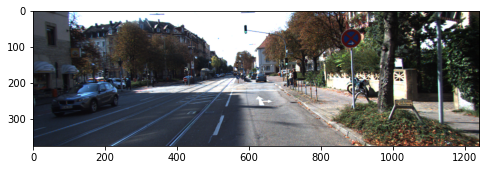

* Ground Truth


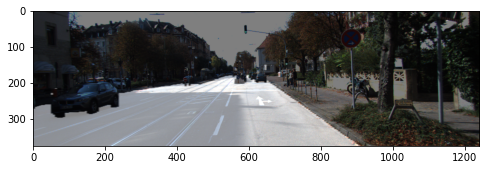

-------------------
(Model 1)
IoU : 0.935672


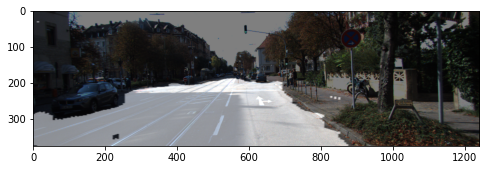

--------------------------------------------------------------------------------
(Model 2)
IoU : 0.874041


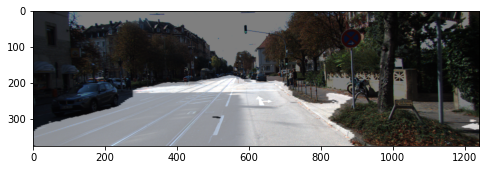

--------------------------------------------------------------------------------
(Model 3)
IoU : 0.884392


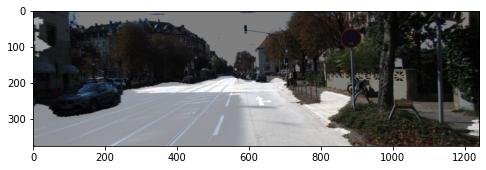

--------------------------------------------------------------------------------


In [132]:
print_and_show(1, [model_unetpp_dp_bn, model_unetpp_dp_bn_, model_unetpp_dp_])

---
---

# 최종 비교

종합하여 비교하기 위해 모델을 불러오는 부분을 한 블럭으로 뭉쳤다.  
위에서 몇가지 비교해봤을 때, 의미가 없던 모델을 제외하고 구성했다.

In [154]:
# U-Net with Binary Crossentropy Loss
model_path_1 = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unet'
Unet = tf.keras.models.load_model(model_path_1)

# U-Net++ without Deep Supervision, BCE and Dice Loss
model_path_2 = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp'
UnetPp = tf.keras.models.load_model(model_path_2, custom_objects={'bce_dice_loss':bce_dice_loss, 'iou_seg': iou_seg})

# U-Net++ with Deep Supervision, BCE and Dice Loss
model_path_3 = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp_dp'
UnetPpDs = tf.keras.models.load_model(model_path_3, custom_objects={'bce_dice_loss':bce_dice_loss, 'iou_seg': iou_seg})

# U-Net++ with Deep Supervision, BCE and Dice Loss (+ Batch Normalization)
model_path_4 = '/content/drive/MyDrive/Colab Notebooks/GD_10/checkpoint/unetpp_dp_bn'
UnetPpDsBn = tf.keras.models.load_model(model_path_4, custom_objects={'bce_dice_loss':bce_dice_loss, 'iou_seg': iou_seg})

-------------------
----- Image 1 -----
-------------------
* Original


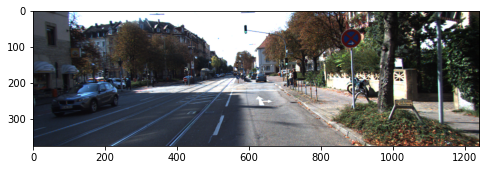

* Ground Truth


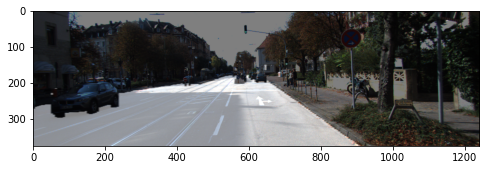

-------------------
(Model 1)
IoU : 0.856781


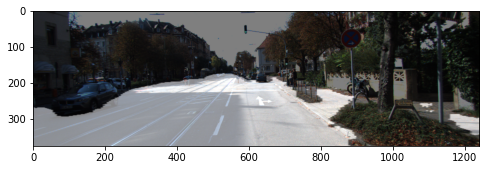

--------------------------------------------------------------------------------
(Model 2)
IoU : 0.798741


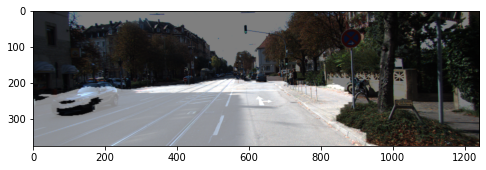

--------------------------------------------------------------------------------
(Model 3)
IoU : 0.901865


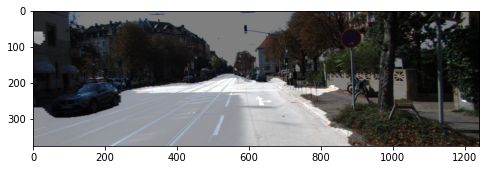

--------------------------------------------------------------------------------
(Model 4)
IoU : 0.860029


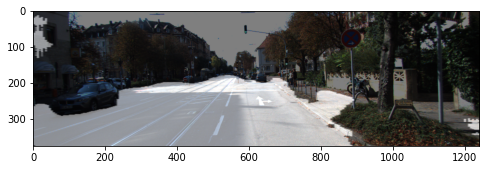

--------------------------------------------------------------------------------


In [155]:
print_and_show(1, [Unet, UnetPp, UnetPpDs, UnetPpDsBn])

-------------------
----- Image 5 -----
-------------------
* Original


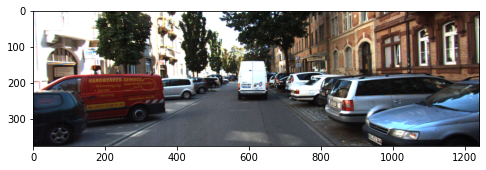

* Ground Truth


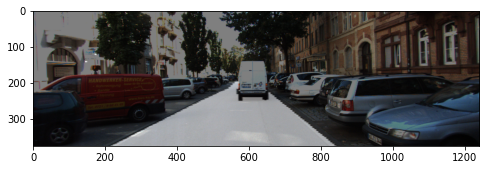

-------------------
(Model 1)
IoU : 0.616268


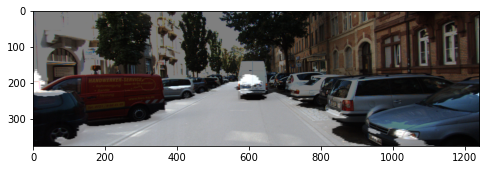

--------------------------------------------------------------------------------
(Model 2)
IoU : 0.395861


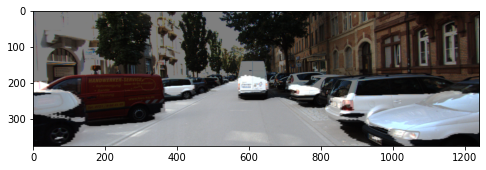

--------------------------------------------------------------------------------
(Model 3)
IoU : 0.669812


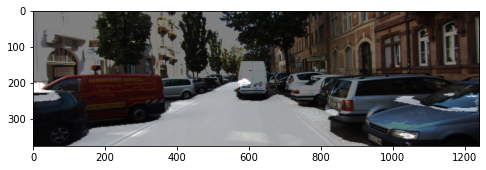

--------------------------------------------------------------------------------
(Model 4)
IoU : 0.658722


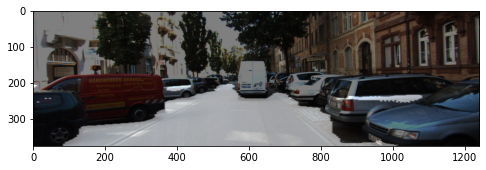

--------------------------------------------------------------------------------


In [157]:
print_and_show(5, [Unet, UnetPp, UnetPpDs, UnetPpDsBn])

-------------------
----- Image 10 -----
-------------------
* Original


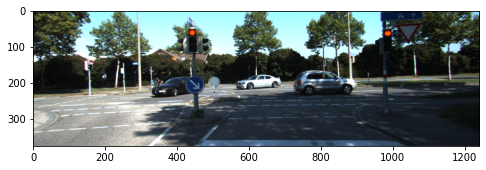

* Ground Truth


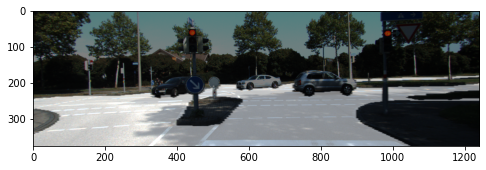

-------------------
(Model 1)
IoU : 0.730125


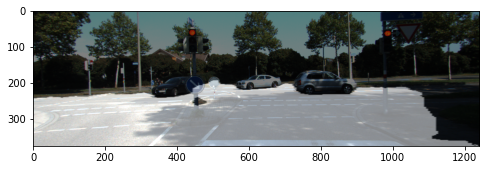

--------------------------------------------------------------------------------
(Model 2)
IoU : 0.686355


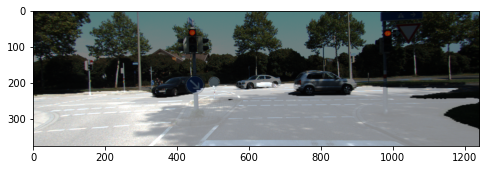

--------------------------------------------------------------------------------
(Model 3)
IoU : 0.710568


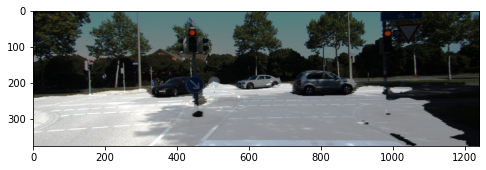

--------------------------------------------------------------------------------
(Model 4)
IoU : 0.752569


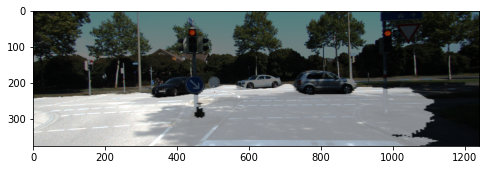

--------------------------------------------------------------------------------


In [158]:
print_and_show(10, [Unet, UnetPp, UnetPpDs, UnetPpDsBn])

-------------------
----- Image 50 -----
-------------------
* Original


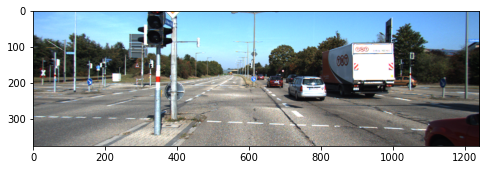

* Ground Truth


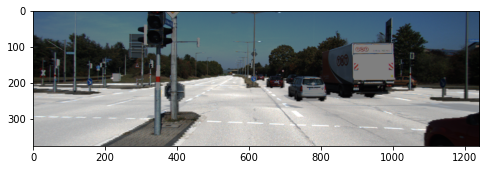

-------------------
(Model 1)
IoU : 0.841465


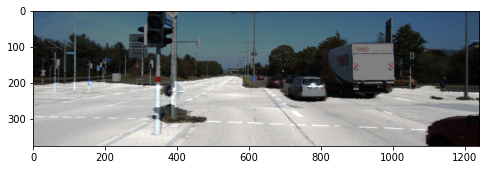

--------------------------------------------------------------------------------
(Model 2)
IoU : 0.795709


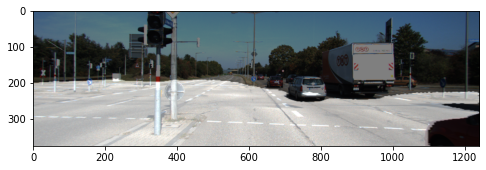

--------------------------------------------------------------------------------
(Model 3)
IoU : 0.770673


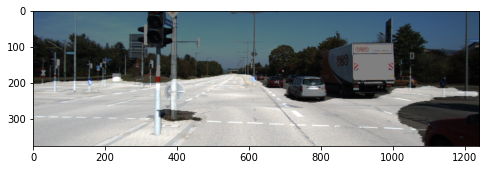

--------------------------------------------------------------------------------
(Model 4)
IoU : 0.848169


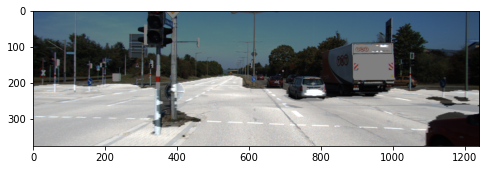

--------------------------------------------------------------------------------


In [161]:
print_and_show(50, [Unet, UnetPp, UnetPpDs, UnetPpDsBn])

-------------------
----- Image 7 -----
-------------------
* Original


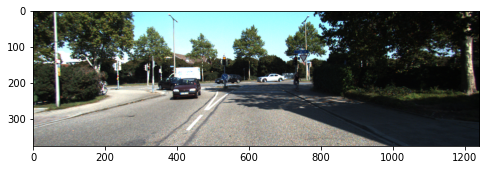

* Ground Truth


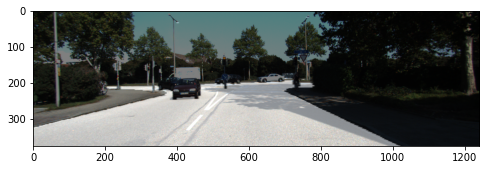

-------------------
(Model 1)
IoU : 0.724857


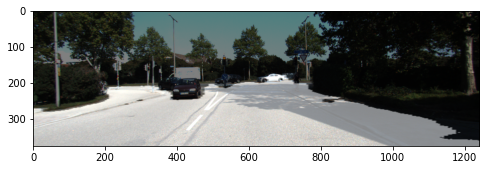

--------------------------------------------------------------------------------
(Model 2)
IoU : 0.671402


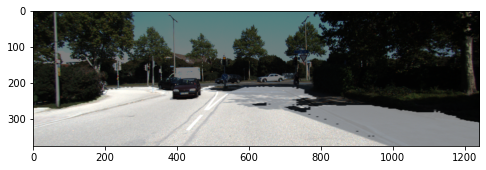

--------------------------------------------------------------------------------
(Model 3)
IoU : 0.727100


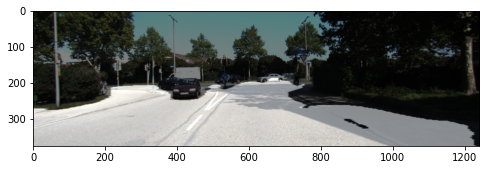

--------------------------------------------------------------------------------
(Model 4)
IoU : 0.847030


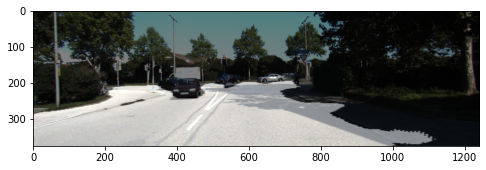

--------------------------------------------------------------------------------


In [167]:
print_and_show(7, [Unet, UnetPp, UnetPpDs, UnetPpDsBn])

---
---

# 결론 및 회고

* 우선, 학습의 경우 기본 U-Net 모델은 Binary crossentropy loss를 기반으로 best 모델을 저장한다.  
U-Net++ 모델들의 경우 추측값과 정답값과의 IoU를 기준으로 best 모델을 저장한다.
또한 EarlyStopping 함수를 이용해 더이상 성능이 좋아지지 않으면 학습이 종료되도록 설계하여, 모델 별 epoch 수는 다르지만 각각에 맞게 최적화 되었다고 생각한다.

* 정성적으로 비교를 해보면, 도로의 가운데 부분에 물체가 있는 경우, U-Net 모델이 그 물체를 제외하는 능력이 더 뛰어나 보인다.  
반대로 가운데 부분에 물체가 없는 경우는 U-Net++ 모델들이 더 좋은 모습을 나타낸다.

* 정량적으로 비교를 해보면, 정성적 비교에서 본 것과 마찬가지의 경향을 보인다.  
기본적으로 U-Net의 성능이 좋긴 하지만, U-Net++ 모델이 조금은 더 좋은 성능을 보인다.  
또한, 이미지에 따라 성능이 크게 널뛰는 모습도 볼 수 있다.

* 최대 300번의 epoch을 진행하였기에 실제로 완전히 수렴하기 위해서는 learning rate를 조절하여 더 많은 학습이 필요해보인다.  
그러나 최대 300번으로도 충분히 성능 확인이 가능했다.

* 많은 U-Net++ 모델 구현을 보니, 컨볼루션 레이어 다음에 batch normaliztion을 주는 경우가 많았다.  
아무래도 안정화를 하기 위함인것 같다.  
이럴 경우, 학습 진행시에 loss 값이 기존보다 훨씬 천천히 떨어지는 모습을 볼 수 있었다.  

* 세그멘테이션에 대해 막연히 어렵다고만 생각했었는데 직접 모델을 구현하고 학습을 해보니 흥미가 생겼고, ResNet에 이은 모델 구현 과정을 통해 CNN 모델의 구현에는 자신감이 생겼다.